In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
df = pd.read_csv(r'D:\Insurance Claim Prediction Project\notebook\data\processed\processed_data.csv') 

In [3]:
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_year,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_date_year,incident_date_month,incident_date_day,csl_per_person,csl_per_accident
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,...,2004,Y,2014,10,17,2015,1,25,250,500
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,...,2007,Y,2006,6,27,2015,1,21,250,500
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,...,2007,N,2000,9,6,2015,2,22,100,300
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,...,2014,Y,1990,5,25,2015,1,10,250,500
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,...,2009,N,2014,6,6,2015,2,17,500,1000


In [4]:
numerical_cols=[cols for cols in df.columns if df[cols].dtype != 'O']

C:\Users\HP\AppData\Local\Temp\ipykernel_8824\2911896077.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True, color='r')
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\2911896077.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True, color='r')
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\2911896077.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True, color='r')
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\2911896077.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please updat

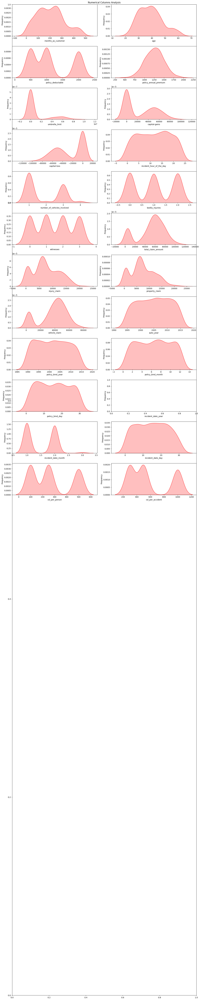

In [5]:
plt.figure(figsize=(15, 3* len(numerical_cols)))
plt.title('Numerical Columns Analysis')
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols), 2, i+1)
    sns.kdeplot(df[col], shade=True, color='r')
    plt.xlabel(col)
    plt.ylabel("Frequency")
    

plt.tight_layout()
plt.show()


# Insights from the Charts

- Most features are not normal → The data doesn’t look like a smooth bell curve. Instead, many features are skewed to one side, meaning regular statistical methods might not work well unless we adjust the data.

- No gains or losses in most claims → For capital-gains and capital-loss, most values are zero. This means that usually, insurance claims don’t involve extra money gained or lost.

- Vehicles are mostly new → The vehicle_age chart shows that most insured cars are quite new, with fewer older cars in the data.

- Some features are step-like, not continuous → Columns like policy_deductable and incident_severity only take specific fixed values (not all possible numbers). These are more like categories than continuous numbers.

- Premiums and limits are uneven → For policy_annual_premium and umbrella_limit, most people pay smaller amounts or have no extra coverage, while only a few have very high premiums or large umbrella limits.

In [6]:
threshold=5
low_cat_columns=[cols for cols in df.columns if cols not in numerical_cols and df[cols].nunique()<threshold]

C:\Users\HP\AppData\Local\Temp\ipykernel_8824\4282077747.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col],palette="Set2")
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\4282077747.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col],palette="Set2")
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\4282077747.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[col],palette="Set2")
C:\Users\HP\AppData\Local\Temp\ipykernel_8824\4282077747.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated 

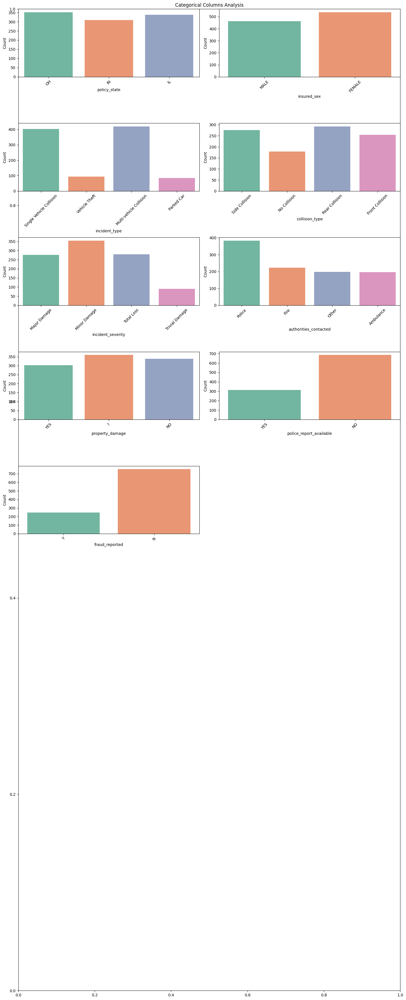

In [7]:
plt.figure(figsize=(15,4*len(low_cat_columns)))
plt.title('Categorical Columns Analysis')

for i,col in enumerate(low_cat_columns):
    plt.subplot(len(low_cat_columns),2,i+1)
    sns.countplot(x=df[col],palette="Set2")
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.ylabel('Count')
    

plt.tight_layout()
plt.show()



- Accident Type → Most accidents are collisions, especially multi-vehicle and rear-end crashes.

- Severity → The majority of cases are minor; very few end in a total loss.

- Reporting → Police are often called, but many reports are missing from records.

- Fraud → Fraud claims are rare.

- Geography & Demographics → More cases are seen in Ohio (OH) and Illinois (IL), and slightly more claims involve female policyholders.

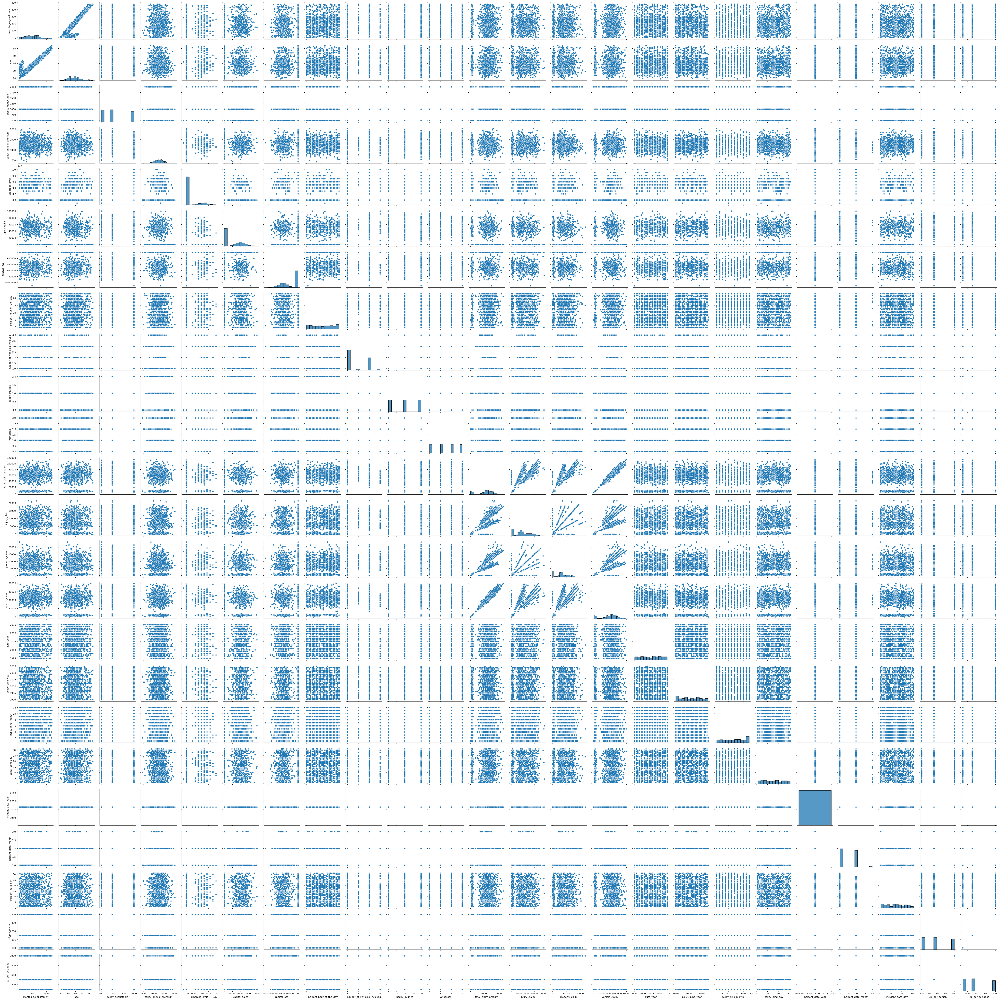

In [8]:
sns.pairplot(data=df)

In [9]:
high_cat_columns=[cols for cols in df.columns if cols not in numerical_cols and cols not in low_cat_columns]

In [10]:
high_cat_columns

['insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_state',
 'incident_city',
 'auto_make',
 'auto_model']

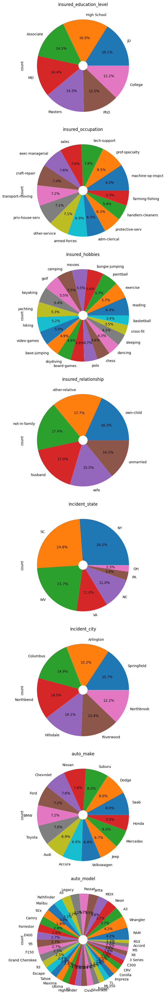

In [11]:
plt.figure(figsize=(25, 5 * len(high_cat_columns)))

for i, col in enumerate(high_cat_columns):
    plt.subplot(len(high_cat_columns), 1, i + 1)
    df[col].value_counts().plot.pie(autopct='%1.1f%%',wedgeprops={'width': 0.9} )
    plt.title(col)
    

plt.tight_layout()
plt.show()

# Insights from Categorical Features

- Insured Education Level

Customers are evenly spread across education levels.

Slightly higher share from High School (16%) and JD (16%), while other levels like College, Masters, PhD are around 12–14% each.

No single group dominates, so education isn’t heavily skewed.

- Insured Occupation

Occupations are widely distributed, with no strong majority.

Sales, tech-support, and prof-specialty are slightly higher (~8%).

Most jobs like craft-repair, farming, armed forces, and clerical are all around 6–7%, meaning occupations are quite balanced.

- Insured Hobbies

Very diverse hobbies; no hobby dominates.

Top hobbies (movies, exercise, reading, paintball) each ~5–6%.

Other hobbies like hiking, golf, video games, dancing, etc. each ~4–5%.

Suggests the insured population has broad lifestyle diversity.

- Insured Relationship

Top categories: Own-child (18%), Other-relative (17.7%), Not-in-family (17.4%), and Husband (17%).

Nearly equal split among family types → indicates claims are spread across family roles.

- Incident State

Most incidents occur in NY (27%), SC (25%), and WV (22%).

Other states like PA, NC, WA are much smaller (~11% each).

Suggests geographic concentration of claims in just a few states.

- Incident City

Incidents are fairly evenly spread across cities.

Springfield (16%), Arlington (15%), Columbus (15%) slightly higher.

Remaining cities (Northbrook, Hilldale, Riverwood, Northbend) around 13–15%.

- Auto Make

Top car brands: Suburu, Dodge, Saab, Honda, Mercedes, Jeep (all ~8%).

Other brands (Chevrolet, Ford, BMW, Toyota, Audi) are slightly lower (~7%).

Indicates no single car make dominates, but a few brands are slightly more common.

- Auto Model

Very fragmented: many car models, each with 2–3% share.

No single model stands out → suggests wide variety of insured vehicles.

Diversity makes model-level trends harder to generalize.

<Axes: ylabel='count'>

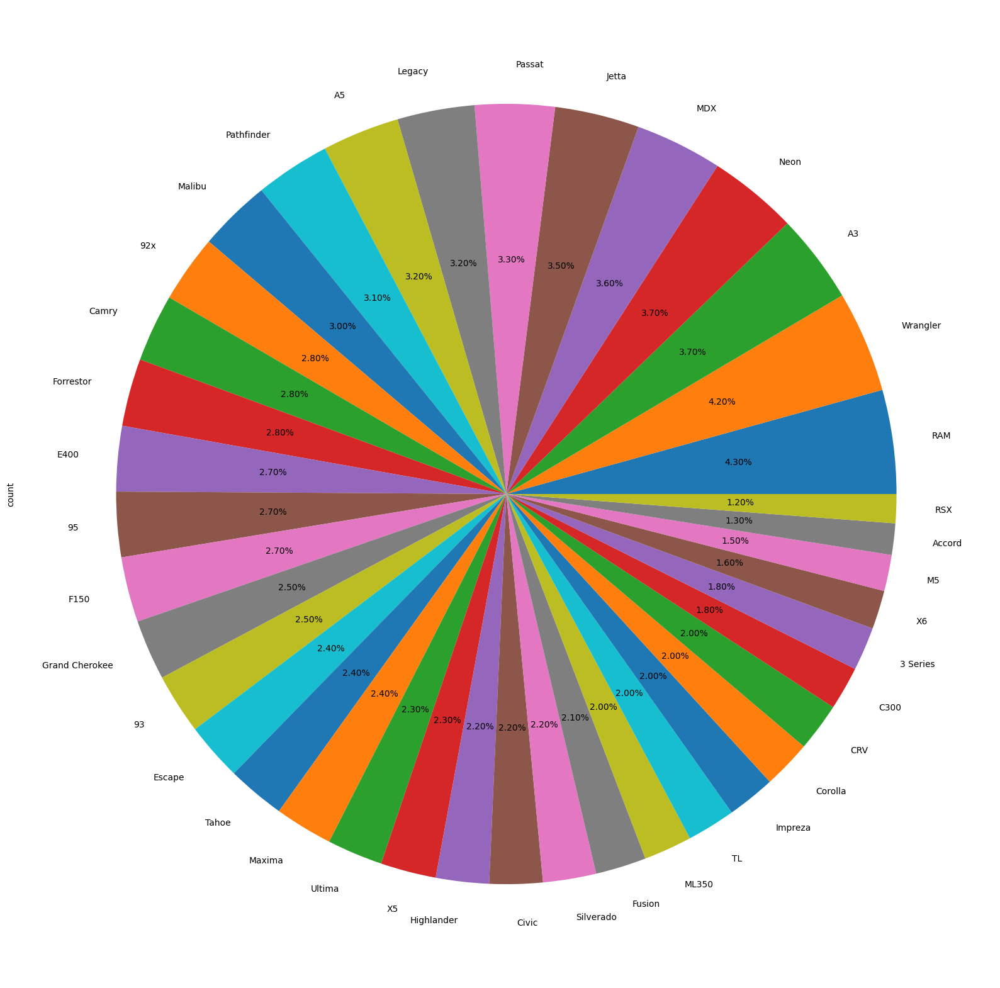

In [12]:
plt.figure(figsize=(20,30))
df['auto_model'].value_counts().plot.pie(autopct='%1.2f%%')

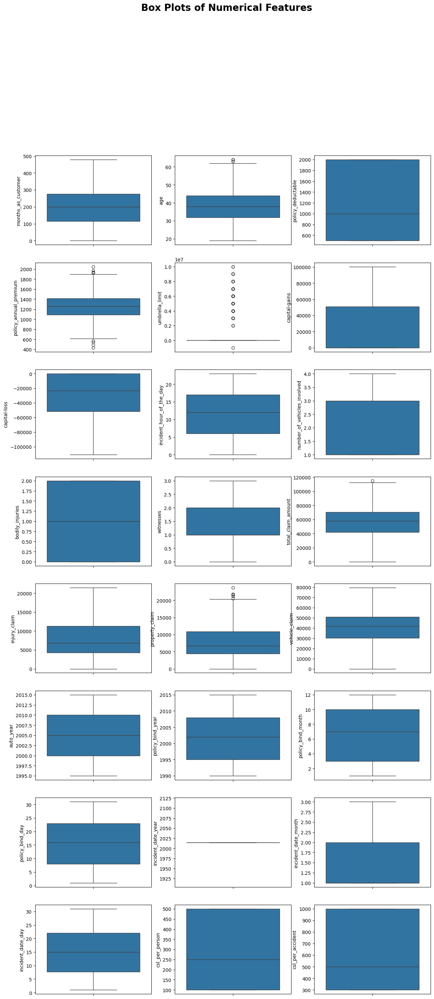

In [13]:

num_plots = len(numerical_cols)
ncols = 3  # Or any number you prefer
nrows = (num_plots + ncols - 1) // ncols

plt.figure(figsize=(5 * ncols, 4 * nrows))
plt.suptitle('Box Plots of Numerical Features',
             fontsize=20, fontweight='bold', y=1.02)

for i, col in enumerate(numerical_cols):
    ax = plt.subplot(nrows, ncols, i + 1)
    sns.boxplot(y=df[col], ax=ax)
    plt.ylabel(col)


In the above chart i found that columns(policy_annual_premium,capital-gains, capital-loss,property_claim and umbrella_limit) having so many outliers that can affect the performance of our model so we need to remove them ..

In [14]:
columns=['policy_annual_premium','capital-gains','capital-loss','property_claim','umbrella_limit']
for col in columns:
    lower_bound = df[col].quantile(0.05)
    upper_bound = df[col].quantile(0.95)
    # Replace values outside the bounds with the bound values
    df[col] = df[col].clip(lower=lower_bound,upper=upper_bound)


C:\Users\HP\AppData\Local\Temp\ipykernel_8824\2854361714.py:6: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=lower_bound,upper=upper_bound)


<Axes: >

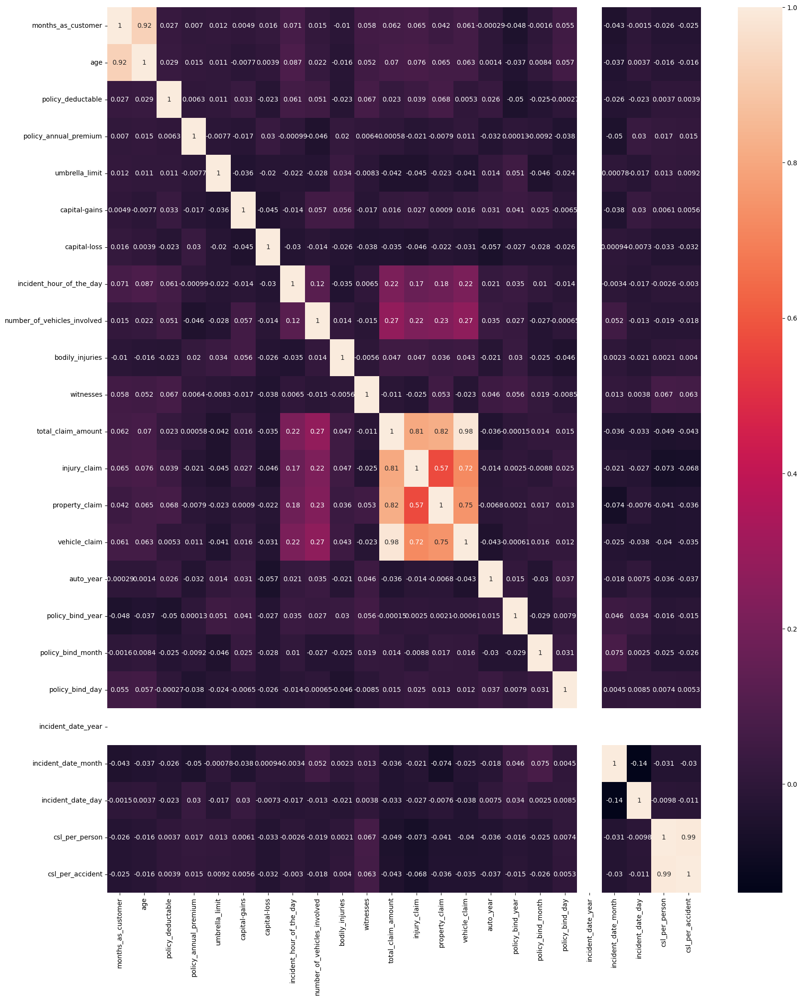

In [15]:
corr=df[numerical_cols].corr()
plt.figure(figsize=(20,len(numerical_cols)))
sns.heatmap(corr,annot=True)

From the above chart i observed that injury_claim, property_claim, vehicle_claim and total_claim_amount has highly positive co-relation, so we need to drop them only keeping total_claim_amount

# Strong Positive Correlations:

- months_as_customer & age → 0.92

- total_claim_amount & vehicle_claim → 0.98

- total_claim_amount & property_claim → 0.82

- total_claim_amount & injury_claim → 0.81

- vehicle_claim & injury_claim → 0.72

- vehicle_claim & property_claim → 0.75

- csl_per_person & csl_per_accident → 0.99


In [16]:
drop_cols=['months_as_customer','csl_per_accident','injury_claim', 'property_claim', 'vehicle_claim']
df.drop(columns=drop_cols,inplace=True)

In [17]:
numerical_cols=[cols for cols in df.columns if df[cols].dtype!='O']

<Axes: >

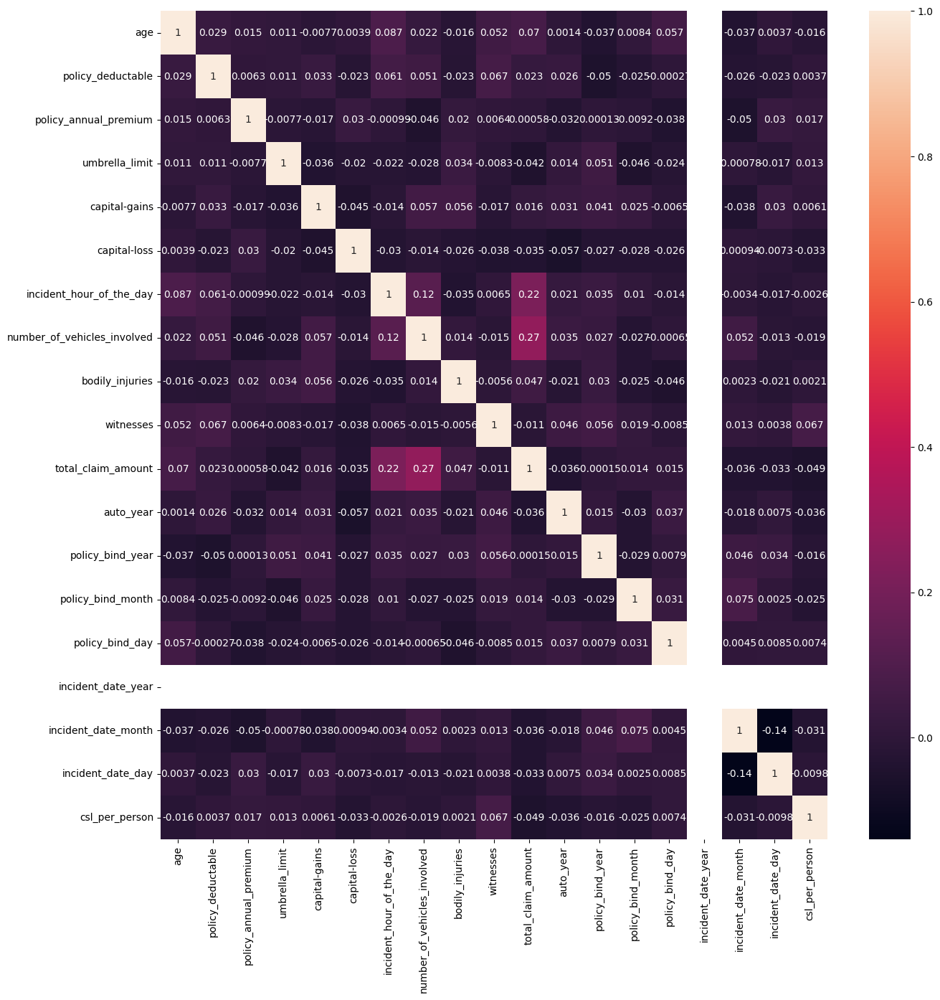

In [18]:
plt.figure(figsize=(15,15))
sns.heatmap(df[numerical_cols].corr(),annot=True)

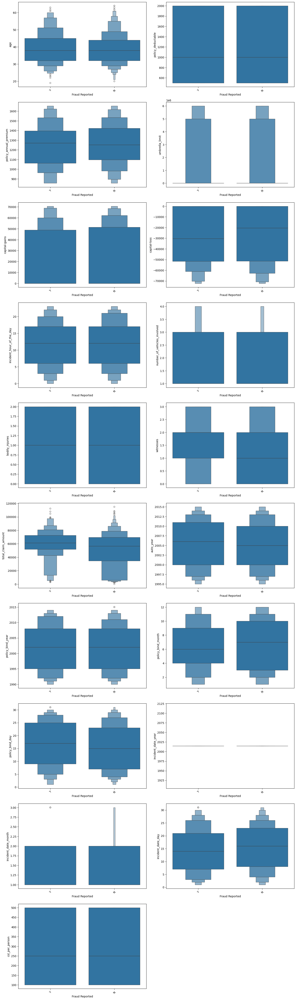

In [19]:
plt.figure(figsize=(15, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols), 2, i+1)
    sns.boxenplot(x='fraud_reported',y=col,data=df)
    plt.xlabel('Fraud Reported')
    plt.ylabel(col)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [22]:
df.columns

Index(['age', 'policy_state', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'auto_make', 'auto_model', 'auto_year', 'fraud_reported',
       'policy_bind_year', 'policy_bind_month', 'policy_bind_day',
       'incident_date_year', 'incident_date_month', 'incident_date_day',
       'csl_per_person'],
      dtype='object')

In [40]:
low_cat_columns=['policy_state',
 'insured_sex',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'property_damage',
 'police_report_available'] # removing 'fraud_reported' from low cat columns

In [41]:
## updating preprocessor

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder,StandardScaler
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
numeric_transformer = Pipeline(
    steps=[
        ('imputer',SimpleImputer(strategy='median')),
        ('scaler',StandardScaler())
    ]
)
low_cat_transformer = Pipeline(
    steps=[
        ('imputer',SimpleImputer(strategy='most_frequent')),
        ('onehot',OneHotEncoder(handle_unknown='ignore',drop='first'))
    ]
)
high_cat_transformer = Pipeline(
    steps=[
        ('imputer',SimpleImputer(strategy='most_frequent')),
        ('target_encoder',ce.TargetEncoder())
   ]
)
preprocessor= ColumnTransformer(
    transformers=[
        ('numerical_columns',numeric_transformer,numerical_cols),
        ('low_cat_columns',low_cat_transformer,low_cat_columns),
        ('high_cat_columns',high_cat_transformer,high_cat_columns)
    ]
)


In [42]:
target = 'fraud_reported'
X = df.drop(columns=[target])
y = df[target]

In [44]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.3,random_state=42)

X_train=preprocessor.fit_transform(X_train,y_train)
X_test=preprocessor.transform(X_test)

preprocessor_file_path=os.path.join(os.getcwd(),'preprocessor.pkl')

import pickle
with open(preprocessor_file_path,'wb') as file_obj:
    pickle.dump(preprocessor,file_obj)

In [ ]:
## upscaling the dataset
smote=SMOTE(random_state=42)
X_train,y_train=smote.fit_resample(X_train,y_train)
smote_file_path=os.path.join(os.getcwd(),'smote.pkl')
with open(smote_file_path,'wb') as file_obj:
    pickle.dump(smote,file_obj)

In [47]:
## Updating the csv file with new columns 
data_dir=os.path.join('data','processed')
os.makedirs(data_dir,exist_ok=True)
df.to_csv(os.path.join(data_dir,'processed_data.csv'),index=False)